# Cropping timestamps out of photos

Using PIL or OpenCV package

In [3]:
from PIL import Image
import os

Test with single image first

In [7]:
# Folder for images to crop with vehicles in them
crop_dir = 'imgs_to_crop/vehicle'

In [8]:
# List of filenames in that folder
vehicle_filenames = os.listdir(crop_dir)
vehicle_filenames[:5]

['FAPI9jUX0AECPjd.jpg',
 'FAPjv6bWQAIfWsZ.jpg',
 'FAPCoelWEAYT7Kj.jpg',
 'blocked_bike_lane_no_bike_marking.jpeg',
 'FBXiqIuWQAUVqUS.jpg']

imgs_to_crop/vehicle/FAPI9jUX0AECPjd.jpg


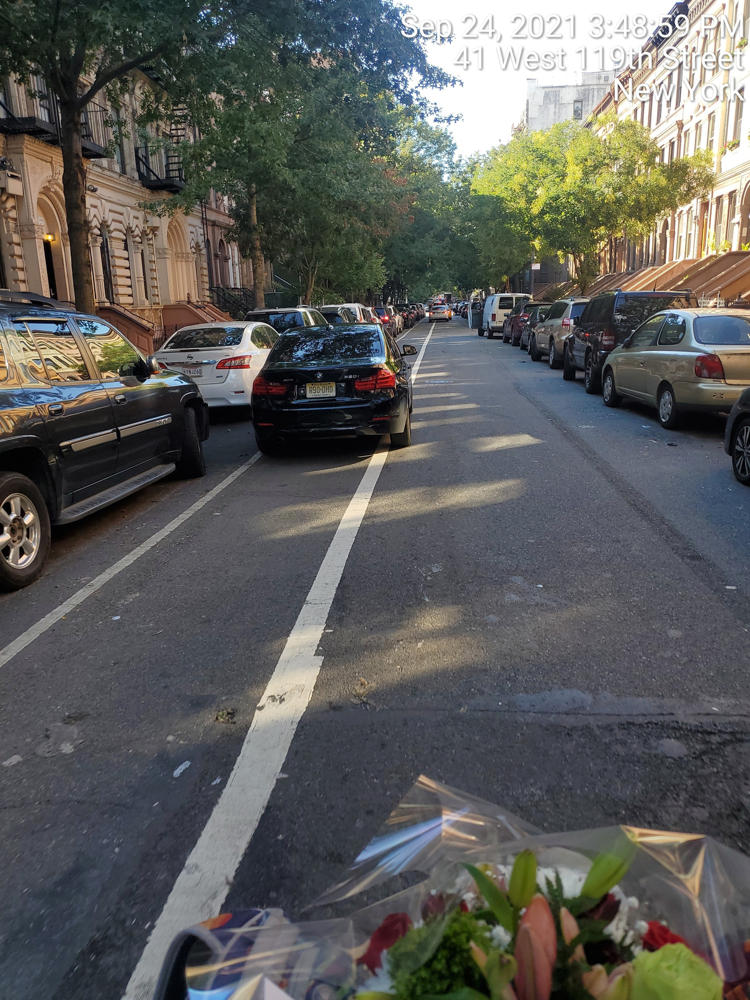

In [13]:
# Get filepath of first image
test_img_filepath = os.path.join(crop_dir, vehicle_filenames[0])
print(test_img_filepath)

# Open test image
test_img = Image.open(test_img_filepath)
test_img

The flowers at the bottom are irrelevant and a non-repetitive feature in the dataset. However, that timestamp at the top is problematic because it appears in almost 100 target class images, but only 10 non-target class images. This means it could be a confounding variable in the model (i.e., the model could ID photos with that timestamp feature as more likely to belong to the target class, even though it's not relevant to the actual target).

Let's crop it out!

In [17]:
# Get current image dims
width, height = test_img.size
print('Width = ', width)
print('Height =', height)

Width =  1210
Height = 1613


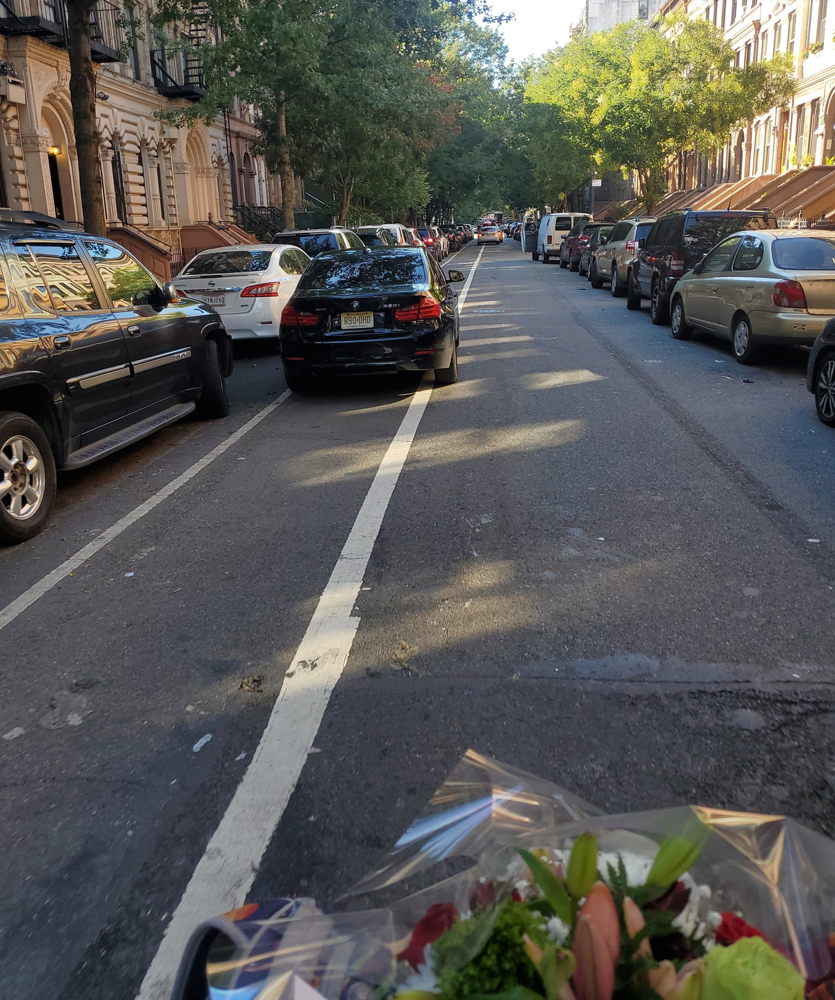

In [30]:
# Designate dims of area to keep
left = 0
top = 165
right = width
bottom = height

box = (left, top, right, bottom)

# Crop the image and display the newly cropped version
cropped_img = test_img.crop(box) 
cropped_img

In [31]:
# Save the new file
cropped_img.save('cropped_img.jpeg')

Huzzah! So setting `top = 165` is enough to crop out the timestamp and maintain the rest of the image.

After inspecting each of the photos, it looks like this will be the best method, even for images in landscape (horizontal) orientation because the actual 'action' of the image is likely to be cut off with a crop of right-side columns. In other words, the car and bike lane part of the image would potentially be cropped out of the image by cutting the right side of the image instead of the top.

## Cropping the whole batch

Now let's crop all the images in the folder and save the copies to a new folder.

In [34]:
# Folders for images to crop with vehicles in them
crop_vehicles_dir = 'imgs_to_crop/vehicle'
crop_open_dir = 'imgs_to_crop/open'

# Folders to save cropped images
cropped_vehicles_dir = 'cropped_imgs/vehicles'
cropped_open_dir = 'cropped_imgs/open'

# List of filenames in each folder
vehicle_filenames = os.listdir(crop_vehicles_dir)
open_filenames = os.listdir(crop_open_dir)

In [35]:
print(vehicle_filenames[:5])
print('-'*10)
print(open_filenames[:5])

['FAPI9jUX0AECPjd.jpg', 'FAPjv6bWQAIfWsZ.jpg', 'FAPCoelWEAYT7Kj.jpg', 'blocked_bike_lane_no_bike_marking.jpeg', 'FBXiqIuWQAUVqUS.jpg']
----------
['IMG_1852.jpeg', 'IMG_1853.jpeg', 'IMG_1854.jpeg', 'IMG_1855.jpeg', 'IMG_1856.jpeg']


In [37]:
def crop_image(dir_, filename, left=0, top=165, right=None, bottom=None):
    '''
    Given a directory and filename, open an image
    and return a cropped version of the image.
    '''
    # Get image
    img_filepath = os.path.join(dir_, filename)
    img = Image.open(test_img_filepath)

    # Get image dims
    width, height = img.size
    
    # Designate dims of area to keep
    left = 0
    top = 165
    if right == None:
        right = width
    if bottom == None:
        bottom = height

    box = (left, top, right, bottom)

    # Return the cropped image
    cropped_img = test_img.crop(box) 
    return cropped_img

Test out the function:

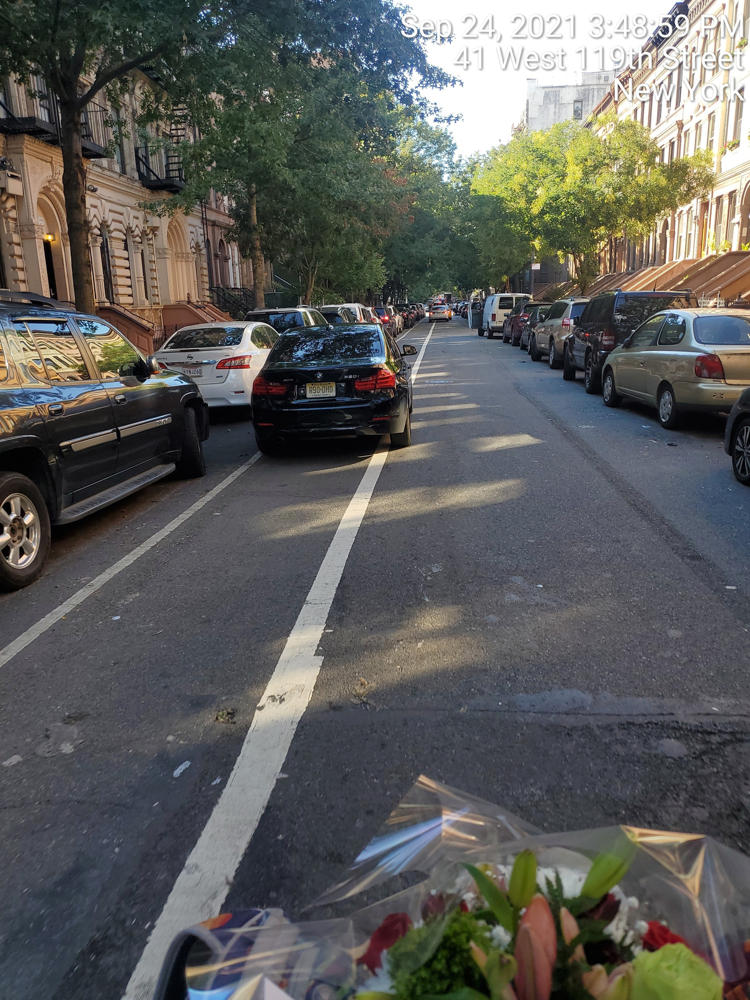

In [39]:
Image.open(os.path.join(crop_vehicles_dir, vehicle_filenames[0]))

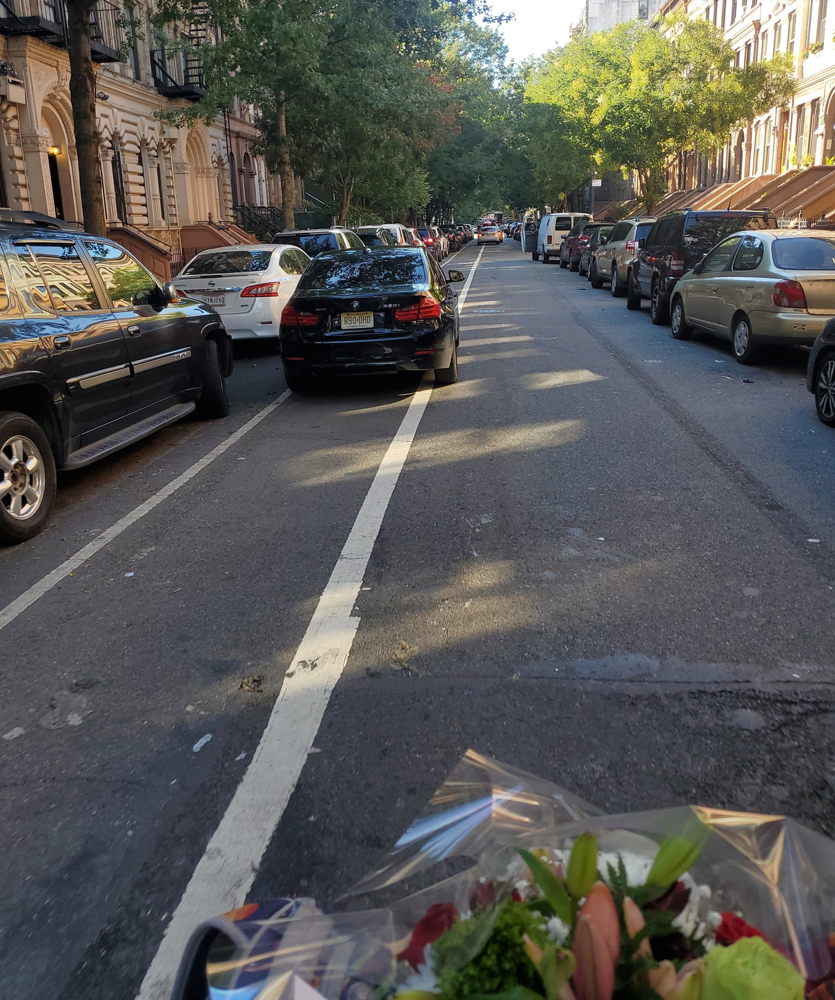

In [38]:
crop_image(crop_vehicles_dir, vehicle_filenames[0])

It works!

In [40]:
def batch_crop_images(input_dir, output_dir):
    '''
    Run `crop_image()` on all files in input_dir,
    saving the results to output_dir.
    '''
    # Track number of images
    count = 0
    
    # Get list of filenames
    filenames = os.listdir(input_dir)
    
    # Crop each image
    for i, file in enumerate(filenames):
        cropped_img = crop_image(input_dir, file)
        # Save the cropped image
        new_filename = os.path.join(output_dir, f'cropped_img_{i}.jpg')
        cropped_img.save(new_filename)
        count = i
    
    print(f'{count} images cropped and saved.')
    
    return

Crop those photos!

In [42]:
batch_crop_images(crop_vehicles_dir, crop_open_dir)

94 images cropped and saved.


Note for Wednesday: currently it's cropping only the first image AND then saving to the wrong folder